# Integration of BAL samples (v10)

In [2]:
import scanpy as sc
import sc_utils
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import sankey
import scvi
import warnings
warnings.simplefilter(action = 'ignore', category = FutureWarning)

Global seed set to 0


In [3]:
data_dir = "/projects/b1038/Pulmonary/cpuritz/PASC/data"

In [3]:
in_dir = "01BAL/01integrated_BAL_v9"
in_name = "01integrated_BAL_v9"

adata_old = sc.read_h5ad(f"{data_dir}/{in_dir}/{in_name}.h5ad")
metadata = pd.read_csv(f"{data_dir}/clinical/metadata.csv")

/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


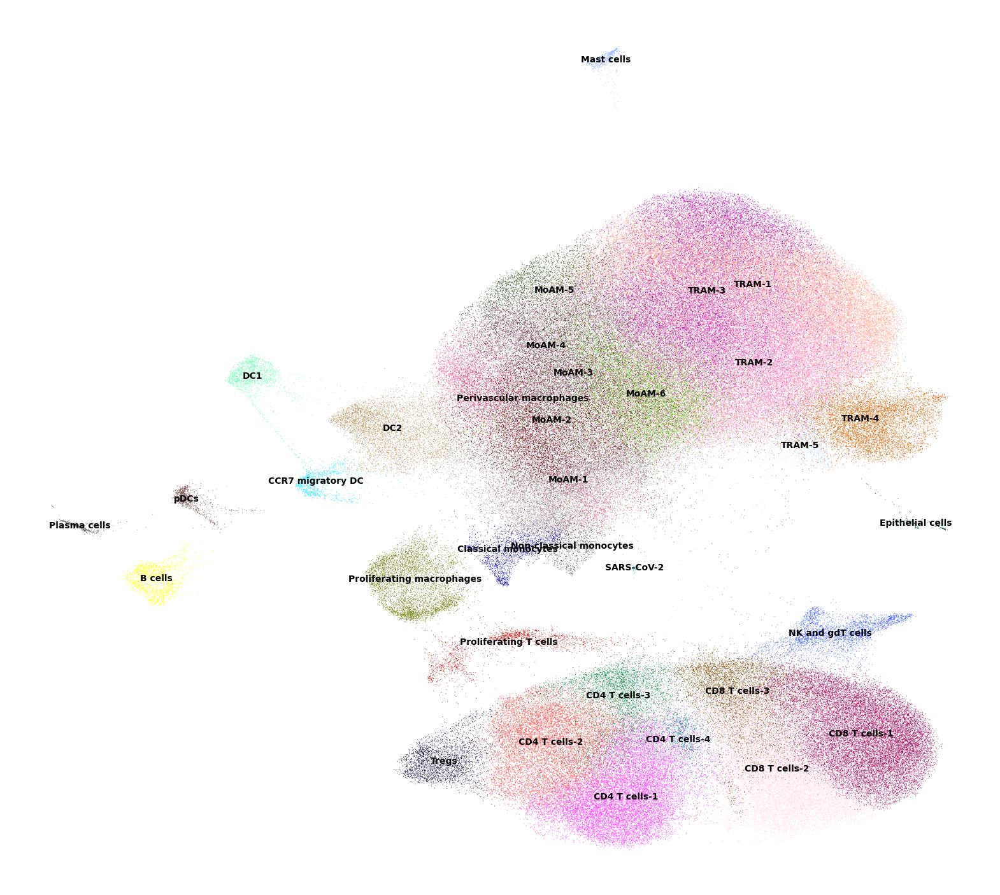

In [5]:
mpl.rcParams["figure.figsize"] = (20, 18)
sc.pl.umap(adata_old, color = "cell_type", legend_loc = "on data", frameon = False, title = "", size = 2)

## Rebuild

In [7]:
# Correspondence between study IDs and sample IDs
id_map = pd.read_csv(f"{data_dir}/clinical/BAL_study_sample_id_map.csv")
# List of all BAL samples
BAL_SC_ids = id_map["BAL scRNAseq ID"].tolist()

# Read in BAL count matrices and add metadata
datasets = []
for i in range(len(BAL_SC_ids)):
    print(f"{i}/{len(BAL_SC_ids)}")
    ddir = f"{data_dir}/BAL_exon_only/{BAL_SC_ids[i]}/filtered_feature_bc_matrix/"
    datasets.append(sc.read_10x_mtx(path = ddir))
    datasets[i].var_names = [x.split("GRCh38_")[-1] for x in datasets[i].var_names]
adata = datasets[0].concatenate(datasets[1:], join = "outer", batch_key = "SC ID", batch_categories = BAL_SC_ids)

0/33
1/33
2/33
3/33
4/33
5/33
6/33
7/33
8/33
9/33
10/33
11/33
12/33
13/33
14/33
15/33
16/33
17/33
18/33
19/33
20/33
21/33
22/33
23/33
24/33
25/33
26/33
27/33
28/33
29/33
30/33
31/33
32/33


In [25]:
# Subset to cells present in previous version
adata = adata[adata.obs.index.isin(adata_old.obs.index)].copy()

In [30]:
adata.obs["is_PASC"] = adata_old.obs.is_PASC
adata.obs["Status"] = adata_old.obs.Status
adata.obs["Study_ID"] = adata_old.obs.Study_ID
adata.obs["old_cell_type"] = adata_old.obs.cell_type

In [31]:
sc.pp.calculate_qc_metrics(adata, percent_top = None, log1p = False, inplace = True)
sc.pp.filter_genes(adata, min_counts = 3)

In [32]:
# Preserve raw counts
adata.layers["counts"] = adata.X.copy()
adata.write(f"{data_dir}/BAL_exon_only/raw/adata_raw.h5ad")

In [33]:
# Normalize counts
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.raw = adata

In [34]:
# Keep only top 1000 highly variable genes
sc.pp.highly_variable_genes(
    adata,
    n_top_genes = 1000,
    subset = True,
    batch_key = "SC ID"
)
# Remove cells with zero expression across HVGs
sc.pp.filter_cells(adata, min_genes = 1)

In [35]:
# Build scVI model
scvi.model.SCVI.setup_anndata(adata, layer = "counts", batch_key = "SC ID")
model_adata = scvi.model.SCVI(adata, n_layers = 2, dropout_rate = 0.2, n_latent = 10)
model_adata.save(f"{data_dir}/BAL_exon_only/models/", overwrite = True, save_anndata = True)

In [36]:
## The model is trained on a Quest GPU node. ##

In [4]:
# Obtain latent representation from model
adata = sc.read_h5ad(f"{data_dir}/BAL_exon_only/models/adata.h5ad")
model_adata = scvi.model.SCVI.load(f"{data_dir}/BAL_exon_only/models/", adata, prefix = "trained")
adata.obsm["X_scVI"] = model_adata.get_latent_representation()

INFO     File /projects/b1038/Pulmonary/cpuritz/PASC/data/BAL_exon_only/models/trainedmodel.pt already downloaded  


In [5]:
# Compute neighborhood graph
sc.pp.neighbors(adata, use_rep = "X_scVI")

In [6]:
# Embed neighborhood graph using UMAP
sc.tl.umap(adata, min_dist = 0.3)

In [10]:
# Perform Leiden clustering
sc.tl.leiden(adata, key_added = "leiden_scVI", resolution = 1.2)

/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


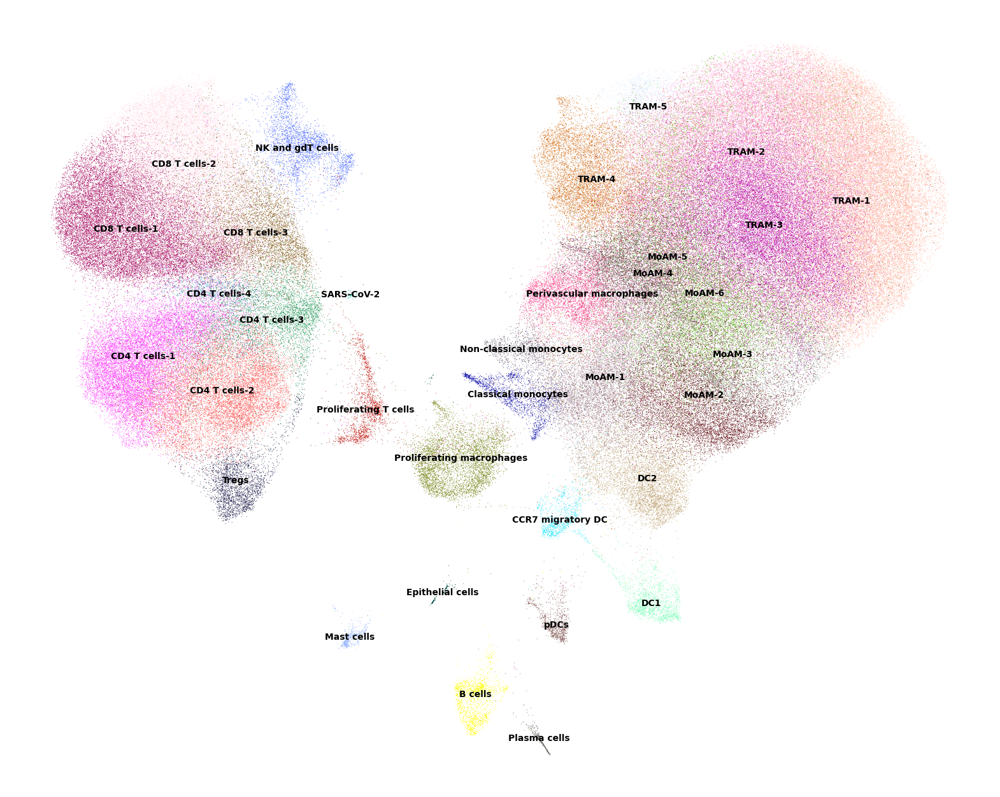

/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


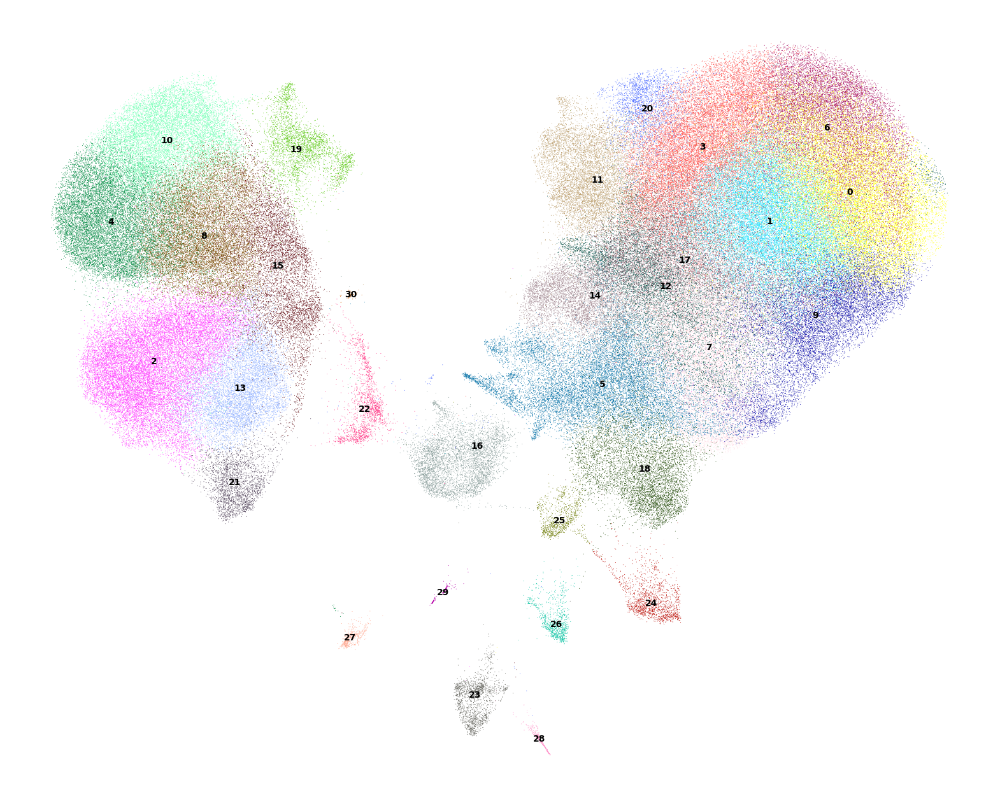

In [11]:
mpl.rcParams["figure.figsize"] = (20, 16)
sc.pl.umap(adata, color = "old_cell_type", legend_loc = "on data", frameon = False, title = "", size = 2)
sc.pl.umap(adata, color = "leiden_scVI", legend_loc = "on data", frameon = False, title = "", size = 2)

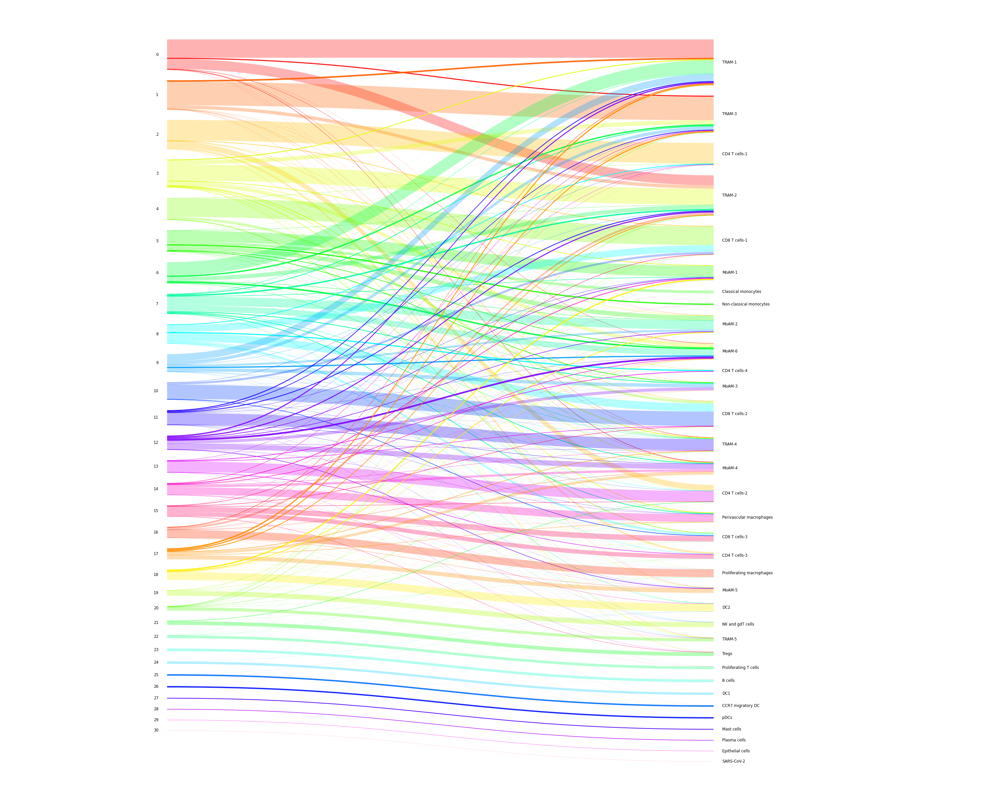

In [12]:
sankey_clusters = pd.merge(adata.obs.leiden_scVI, adata.obs.old_cell_type, left_index = True, right_index = True)
mpl.rcParams["figure.figsize"] = (30, 24)
sankey.sankey(sankey_clusters.leiden_scVI, sankey_clusters.old_cell_type);

In [32]:
adata.obs["cluster"] = adata.obs.leiden_scVI

def recluster(ad, res, ix):
    sc.tl.leiden(ad, key_added = 'cluster', resolution = res)
    cats = ad.obs['cluster'].cat
    ad.obs['cluster'] = cats.rename_categories({c: str(ix) + '-' + c for c in cats.categories})

### Resolve cluster 5

/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


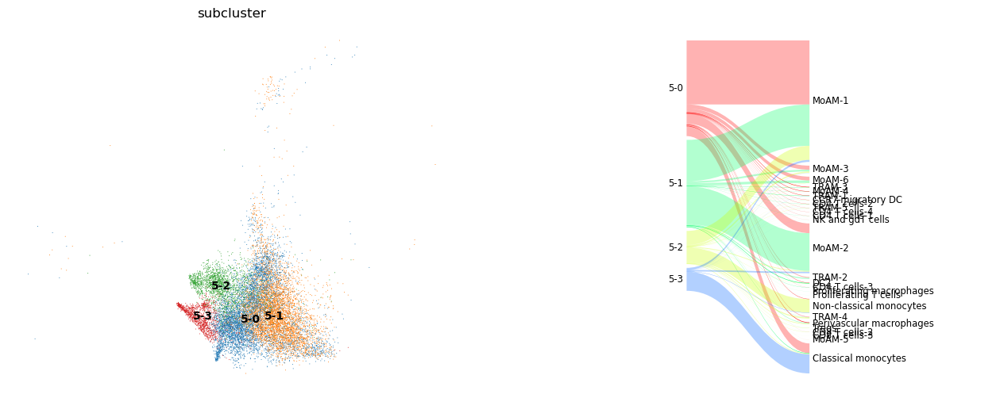

In [33]:
ix = 5
adata_sub = adata[adata.obs["leiden_scVI"] == str(ix)].copy()
recluster(adata_sub, 0.2, ix)
mpl.rcParams["figure.figsize"] = (16, 6)
fig, ax = plt.subplots(1, 2)
sc.pl.umap(adata_sub, color = "subcluster", legend_loc = "on data", frameon = False, size = 2, show = False,
           ax = ax[0])
sankey_clust = pd.merge(adata_sub.obs.subcluster, adata_sub.obs.old_cell_type, left_index = True,
                        right_index = True)
sankey.sankey(sankey_clust.subcluster, sankey_clust.old_cell_type, ax = ax[1]);

In [34]:
adata.obs.update(adata_sub.obs)

### Resolve cluster 15

/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


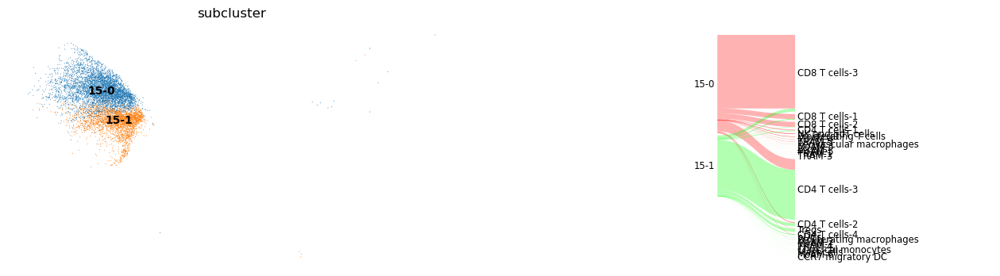

In [35]:
ix = 15
adata_sub = adata[adata.obs["leiden_scVI"] == str(ix)].copy()
recluster(adata_sub, 0.2, ix)
mpl.rcParams["figure.figsize"] = (16, 4)
fig, ax = plt.subplots(1, 2)
sc.pl.umap(adata_sub, color = "subcluster", legend_loc = "on data", frameon = False, size = 2, show = False,
           ax = ax[0])
sankey_clust = pd.merge(adata_sub.obs.subcluster, adata_sub.obs.old_cell_type, left_index = True,
                        right_index = True)
sankey.sankey(sankey_clust.subcluster, sankey_clust.old_cell_type, ax = ax[1]);

In [36]:
adata.obs.update(adata_sub.obs)

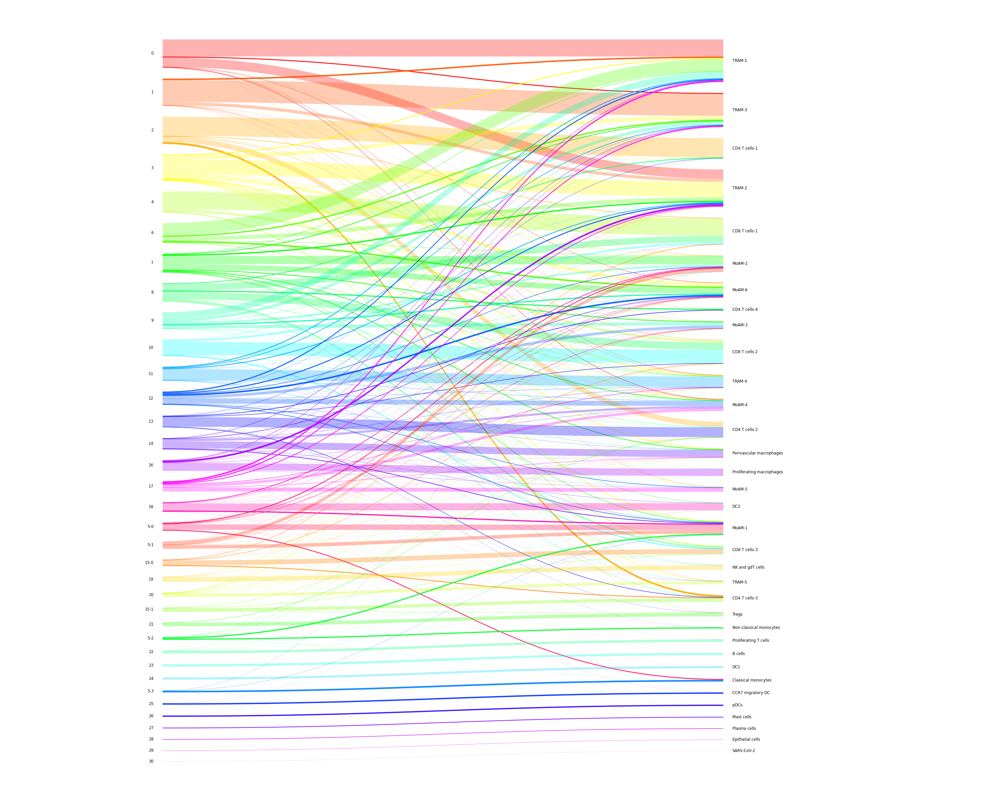

In [38]:
sankey_clusters = pd.merge(adata.obs.cluster, adata.obs.old_cell_type, left_index = True, right_index = True)
mpl.rcParams["figure.figsize"] = (30, 24)
sankey.sankey(sankey_clusters.cluster, sankey_clusters.old_cell_type);

In [48]:
adata.obs.drop(columns = ["leiden_scVI", "subcluster", "_scvi_labels"], inplace = True)

## Compute cluster markers

In [55]:
adata.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, "cluster", method = "wilcoxon", n_genes = 200)

/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/chp4225/.conda/envs/pasc-env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: Performanc

In [57]:
markers = sc_utils.get_markers(adata, "cluster")
pd.options.display.max_rows = 500
markers.groupby("cluster").apply(lambda x: x.sort_values("avg_logFC", ascending = False).head(10))

p_val  avg_logFC     pct.1     pct.2      p_val_adj  \
cluster                                                                     
0       3      0.000000e+00   2.942216  0.983647  0.426545   0.000000e+00   
        0      0.000000e+00   2.698558  0.999649  0.581563   0.000000e+00   
        16     0.000000e+00   2.538576  0.998345  0.572419   0.000000e+00   
        1      0.000000e+00   2.355143  0.978982  0.454699   0.000000e+00   
        5      0.000000e+00   2.196913  0.988814  0.511120   0.000000e+00   
        4      0.000000e+00   2.188910  0.995235  0.598614   0.000000e+00   
        37     0.000000e+00   2.138336  0.997743  0.573350   0.000000e+00   
        9      0.000000e+00   2.126754  0.994934  0.575557   0.000000e+00   
        15     0.000000e+00   2.125344  1.000000  0.787796   0.000000e+00   
        2      0.000000e+00   2.094317  0.996238  0.579194   0.000000e+00   
1       200    0.000000e+00   3.662448  0.984498  0.428357   0.000000e+00   
        201    0.000000e+00   2.932410  0.998956  0.573808   0.000000e+00   
        213    0.000000e+00   2.721818  0.999791  0.613458   0.000000e+00   
        205    0.000000e+00   2.688977  0.999687  0.582973   0.000000e+00   
        204    0.000000e+00   2.637785  0.999635  0.574627   0.000000e+00   
        246    0.000000e+00   2.484951  0.742627  0.249970   0.000000e+00   
        212    0.000000e+00   2.390319  0.999791  0.692123   0.000000e+00   
        207    0.000000e+00   2.375482  1.000000  0.959870   0.000000e+00   
        352    0.000000e+00   2.358310  0.526802  0.134542   0.000000e+00   
        211    0.000000e+00   2.282606  0.992849  0.512398   0.000000e+00   
10      2611   0.000000e+00   5.346582  0.660326  0.044386   0.000000e+00   
        2601   0.000000e+00   5.180108  0.980891  0.236609   0.000000e+00   
        2600   0.000000e+00   5.116362  0.919968  0.146806   0.000000e+00   
        2608   0.000000e+00   4.522059  0.697142  0.072922   0.000000e+00   
        2602   0.000000e+00   4.367632  0.884379  0.160316   0.000000e+00   
        2605   0.000000e+00   4.193090  0.772703  0.102854   0.000000e+00   
        2625   0.000000e+00   4.184841  0.621494  0.080659   0.000000e+00   
        2797  1.647748e-263   4.041047  0.207223  0.014938  1.647748e-263   
        2613   0.000000e+00   4.024934  0.697055  0.088126   0.000000e+00   
        2603   0.000000e+00   3.879136  0.958450  0.277383   0.000000e+00   
11      2903   0.000000e+00   5.919717  0.345027  0.009084   0.000000e+00   
        2918   0.000000e+00   4.408720  0.351434  0.023999   0.000000e+00   
        2800   0.000000e+00   3.235082  0.931259  0.393824   0.000000e+00   
        2805   0.000000e+00   2.418827  0.707647  0.222395   0.000000e+00   
        2899   0.000000e+00   2.413703  0.453224  0.120730   0.000000e+00   
        2801   0.000000e+00   2.338924  0.820521  0.341099   0.000000e+00   
        2803   0.000000e+00   2.303167  0.970612  0.591571   0.000000e+00   
        2958   0.000000e+00   2.249924  0.406142  0.103604   0.000000e+00   
        2817   0.000000e+00   2.127354  0.976205  0.600207   0.000000e+00   
        2884   0.000000e+00   2.107135  0.511491  0.177804   0.000000e+00   
12      3000   0.000000e+00   3.526062  0.988995  0.582208   0.000000e+00   
        3001   0.000000e+00   2.804572  0.994444  0.629485   0.000000e+00   
        3079   0.000000e+00   2.162173  0.368522  0.108637   0.000000e+00   
        3136  1.608621e-269   2.156363  0.283791  0.070343  1.608621e-269   
        3006   0.000000e+00   2.028970  1.000000  0.961513   0.000000e+00   
        3067   0.000000e+00   1.846551  0.439577  0.184700   0.000000e+00   
        3002   0.000000e+00   1.816681  0.993269  0.765655   0.000000e+00   
        3004   0.000000e+00   1.714049  0.872743  0.521629   0.000000e+00   
        3163  1.472295e-231   1.677657  0.312747  0.120820  1.472295e-231   
        3003   0.000000e+00   1.596850  0.988353  0.734500   0.000000e+00   
13      3386  3.94

## Write output

In [58]:
out_version = "v10"
out_dir = f"01BAL/01integrated_BAL_{out_version}"
out_name = f"01integrated_BAL_{out_version}"

In [59]:
adata.write(f"{data_dir}/{out_dir}/{out_name}.h5ad")
adata.obs.to_csv(f"{data_dir}/{out_dir}/{out_name}-metadata.csv")
markers.to_csv(f"{data_dir}/{out_dir}/{out_name}-markers.csv")